# **Checking for Understanding: Exploring the Neurological Frontier**

[![Mindset NeuroSky Source: Instruction Manual Neurosky Mindset](Mindset-NeuroSky-Source-Instruction-Manual-Neurosky-Mindset.png "NeuroSky's MindSet")](https://www.researchgate.net/figure/Mindset-NeuroSky-Source-Instruction-Manual-Neurosky-Mindset_fig1_318656107)
<br>
NeuroSky's MindSet \(EEG biosensor headset\)

Dataset: [Confused student EEG brainwave data](https://www.kaggle.com/datasets/wanghaohan/confused-eeg)
<br>
Promo Video: [EEG-enabled MOOC: detecting confusion in online education](https://www.youtube.com/watch?v=ACjLuMvbAnM)
<br>
Research Paper: [Using EEG to Improve Massive Open Online Courses Feedback Interaction](http://www.cs.cmu.edu/~kkchang/paper/WangEtAl.2013.AIED.EEG-MOOC.pdf)

<br><br><br><br>


# Abstract

In this groundbreaking project, we delve into the uncharted territory of neurological assessment to revolutionize the evaluation of student understanding.
Leveraging the "*Confused student EEG brainwave dataset*" collected for the research article titled "*Using EEG to Enhance Feedback Interaction in Massive Open Online Courses*," we embark on an intricate exploration of brainwave activity.
By employing advanced data visualization techniques, we develop and train a BiLSTM model using TensorFlow Keras.
Our objective is to decode the intricate patterns in EEG data, pushing the boundaries of educational assessment.
Through the integration of cutting-edge technology and visualization, we redefine the process of "Checking for Understanding," opening new doors for personalized learning and instruction.
Join us on this unprecedented journey at the forefront of neurology.

<br><br><br><br>

---
<div id='toc'/></div>

# Table of Contents
1. [Introduction](#section1)
    1. [Data Preparation and Feature Selection](#section1a)
    2. [Exploratory Data Analysis (EDA)](#section1b)
2. [Model Development](#section2)
    1. [BiLSTM Model](#section2a)
    2. [Interpretability with SHAP Analysis](#section2b)
3. [Conclusion](#section3)
    1. [Summary of Results](#section3a)
    2. [Recommendations and Next Steps](#section3b)

---
<div id='section1' style='text-align: right'>
    <a href='#toc'>Table of Contents</a><br>
    <a href='#section1'>Section 1</a><br>
    <a href='#section2'>Section 2</a><br>
    <a href='#section3'>Section 3</a><br>
    <a href='#license'>License</a>
    </div>

# 1. Introduction

The primary objective of this project is to predict confusion levels by utilizing EEG recordings and demographic factors.
Our dataset includes EEG recordings along with demographic information such as age, ethnicity, and gender.
It consists of data from 10 students, each with 10 EEG recordings divided into 0.5-second samples.
The dataset comprises various features, including EEG data, predefined labels indicating confusion levels, and user-defined labels assigned by the subjects themselves.

To ensure the dataset is suitable for analysis and modeling, we perform crucial preprocessing steps.
These steps involve removing irrelevant features and handling missing values.
Additionally, we employ feature engineering and selection techniques to extract relevant information and enhance the performance of our predictive models.

This introduction section provides a comprehensive overview of the project, shedding light on the structure and features of the dataset.
By emphasizing the significance of preprocessing and feature engineering, we underscore their role in preparing the data for analysis and modeling purposes.

<div id='section1a' style='text-align: right'>
    <a href='#section1'>Section 1</a><br>
    <a href='#section1a'>Subsection 1.A</a><br>
    <a href='#section1b'>Subsection 1.B</a><br>
    <a href='#section2'>Section 2</a>
    </div>

## 1.A. Data Preparation and Feature Selection

In this subsection, our focus is on preparing the dataset for analysis and selecting the most relevant features.
The initial dataset includes unnecessary columns such as `Video_ID` and `Subject_ID,` which can hinder model training.
As stated in the dataset description, these IDs are not conducive to learning based on EEG recordings, age, ethnicity, and gender parameters.
Therefore, we remove these columns to ensure our model learns from the appropriate features.
Additionally, we identify and separate continuous features, categorical features, and one-hot encoded categorical features.
We provide a printout of the selected features and their respective categories for reference.
This data preparation and feature selection step serves as the foundation for further analysis and model development.

### Imports

We will use `TensorFlow`'s `Keras` API to construct our neural network.

In [1]:
# Suppressing warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

# Fast and consistent EDA
import ydata_profiling as pp

# Data visualization
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams

import seaborn as sns

# Machine learning
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow.compat.v1
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import InputLayer, Dense, Bidirectional, LSTM, Dropout, Flatten
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import plot_model

# Model interpretability
import shap

# Print DataFrames and display SHAP in dark-themed IDE
from IPython.display import display, HTML

### Functions

**`BiLSTM_Model`:**<br>
This function creates a sequential model using Keras.
It sets up a BiLSTM-based architecture with multiple layers, including `Dense`, `Bidirectional LSTM`, `Dropout`, and `Flatten`.
The model is compiled with the specified optimizer and loss function, and it returns the constructed model.

**`Train_Model`:**<br>
This function is responsible for training the model.
It takes the model, training data, testing data, and other parameters as input.
It uses the `fit` function to train the model on the provided data, using the specified batch size, number of epochs, and callbacks for early stopping, model checkpointing, and learning rate scheduling.
The function also plots the accuracy and loss figures using `Matplotlib`.
It returns the trained model and the training history.

In [2]:
# Defining our model's architecture
def BiLSTM_Model(optimizer='adam', n_features=17):
    model = Sequential()
    
    # Define the model architecture
    model.add(InputLayer(input_shape=(n_features, 1)))
    model.add(Dense(64, activation='relu'))
    model.add(Bidirectional(LSTM(256, return_sequences=True)))
    model.add(Dropout(0.25))
    model.add(Bidirectional(LSTM(256, return_sequences=True)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model


# Training our model
def Train_Model(model, X_train, y_train, X_test, y_test, save_to, kfold_order=None, epoch=50):
    
    if not kfold_order:
        kfold_order = 'singleTrial'
    else:
        print('=============================================================')
        print('Training for fold number '+str(kfold_order))
        print('=============================================================')
    
    opt_adam = Adam(learning_rate=0.001)
    
    early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=10, verbose=1)
    model_checkpoint = ModelCheckpoint(save_to+'_best_model_'+str(kfold_order)+'.h5', save_best_only=True, monitor='val_accuracy', mode='max', verbose=1)
    learning_rate_scheduler = LearningRateScheduler(lambda epoch: 0.001 * np.exp(-epoch/10))
    
    model.compile(optimizer=opt_adam,
                  loss=['binary_crossentropy'],
                  metrics=['accuracy'])
    
    history = model.fit(X_train, y_train,
                        batch_size=20,
                        epochs=epoch,
                        validation_data=(X_test, y_test),
                        callbacks=[early_stopping,
                                   model_checkpoint,
                                   learning_rate_scheduler],
                        verbose=0)
    
    saved_model = load_model(save_to+'_best_model_'+str(kfold_order)+'.h5')
    
    rcParams['figure.figsize'] = 5, 5
    
    # Accuracy and loss figures
    for s in ['accuracy', 'loss']:
        plt.plot(history.history[s])
        plt.plot(history.history['val_'+s])
        plt.title('model '+s)
        plt.ylabel(s)
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        plt.show()
    
    return model, history

### Data

**Dataset: [Confused student EEG brainwave data](https://www.kaggle.com/datasets/wanghaohan/confused-eeg)**<br>
The dataset consists of two CSV files, which will be concatenated into a single DataFrame for further analysis.

In [3]:
# Reading the EEG data CSV file
DF = pd.read_csv('archive/EEG_data.csv')
display(DF.head())

# Reading the demographic info CSV file
DF_demo = pd.read_csv('archive/demographic_info.csv')
display(DF_demo.head())

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,27946.0,45097.0,33228.0,8293.0,0.0,0.0
1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,2746.0,3687.0,5293.0,2740.0,0.0,0.0
2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,36293.0,130536.0,57243.0,25354.0,0.0,0.0
3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,11488.0,62462.0,49960.0,33932.0,0.0,0.0
4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,45307.0,99603.0,44790.0,29749.0,0.0,0.0


,subject ID,age,ethnicity,gender
0,0,25,Han Chinese,M
1,1,24,Han Chinese,M
2,2,31,English,M
3,3,28,Han Chinese,F
4,4,24,Bengali,M


**Data Cleaning:**<br>
The datasets contains misspellings and style inconsistencies.
Notably, the word "meditation" in the first dataset is misspelled as "mediation," and `SubjectID` from the first dataset should match `subject ID` in the second.

**Merging DataFrames based on `Subject_ID`:**<br>
Once we create the common column name `Subject_ID`, we merge the two DataFrames into `df`.

In [4]:
# Creating a new DataFrame with renamed columns
df = DF.copy().rename(columns={'SubjectID':'Subject_ID', 'VideoID':'Video_ID', 'Mediation':'Meditation',
                        'Alpha1':'Alpha_1', 'Alpha2':'Alpha_2', 'Beta1':'Beta_1', 'Beta2':'Beta_2', 'Gamma1':'Gamma_1', 'Gamma2':'Gamma_2',
                        'predefinedlabel':'Predefined_Label', 'user-definedlabeln':'User-defined_Label'})


# Assigning time stamps to each video trial as time points are not available in the imported data

# Creating an empty DataFrame to store time-stamped data
df_time = df.reset_index().drop(df.index)

# Populating the time-stamped DataFrame based on subject and video combinations
for i in range(10):
    for j in range(10):
        query = 'Subject_ID == '+str(i)+' & Video_ID == '+str(j)
        df_temp = df.query(query)
        df_temp = df_temp.reset_index(drop=True)
        df_temp = df_temp.reset_index()
        df_time = pd.concat([df_time, df_temp])

# Renaming the 'index' column to 'Time_Point' and resetting the index
df = df_time.rename(columns={'index': 'Time_Point'}).reset_index(drop=True)


# Creating a new DataFrame with renamed columns for demographic info
df_demo = DF_demo.copy().rename(columns={'subject ID':'Subject_ID', ' age':'Age', ' ethnicity':'Ethnicity', ' gender':'Gender'})

# Performing one-hot encoding on the categorical variables ('Age', 'Ethnicity', 'Gender') in df_demo
df_demo_dum = pd.get_dummies(df_demo)

# Merging the df and df_demo_dum DataFrames based on Subject_ID
df = pd.merge(df, df_demo_dum)

# Creating a copy of df to prevent a warning in the next cell
df_hold = df.copy()

# Displaying the final DataFrame
display(df)

,Time_Point,Subject_ID,Video_ID,Attention,Meditation,Raw,Delta,Theta,Alpha_1,Alpha_2,...,Gamma_1,Gamma_2,Predefined_Label,User-defined_Label,Age,Ethnicity_Bengali,Ethnicity_English,Ethnicity_Han Chinese,Gender_F,Gender_M
0,0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,...,33228.0,8293.0,0.0,0.0,25,0,0,1,0,1
1,1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,...,5293.0,2740.0,0.0,0.0,25,0,0,1,0,1
2,2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,...,57243.0,25354.0,0.0,0.0,25,0,0,1,0,1
3,3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,...,49960.0,33932.0,0.0,0.0,25,0,0,1,0,1
4,4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,...,44790.0,29749.0,0.0,0.0,25,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12806,117,9.0,9.0,64.0,38.0,-39.0,127574.0,9951.0,709.0,21732.0,...,2598.0,960.0,1.0,0.0,24,0,0,1,1,0
12807,118,9.0,9.0,61.0,35.0,-275.0,323061.0,797464.0,153171.0,145805.0,...,36574.0,10010.0,1.0,0.0,24,0,0,1,1,0
12808,119,9.0,9.0,60.0,29.0,-426.0,680989.0,154296.0,40068.0,39122.0,...,20427.0,2024.0,1.0,0.0,24,0,0,1,1,0
12809,120,9.0,9.0,60.0,29.0,-84.0,366269.0,27346.0,11444.0,9932.0,...,12323.0,1764.0,1.0,0.0,24,0,0,1,1,0


### Feature Selection

The code removes unnecessary columns, such as `Video_ID` and `Subject_ID`, from the DataFrame.
These columns would hinder the model training process because there are 10 video clips for 10 students, and these clips are divided into 0.5-second samples.
If we include the IDs as features, the model may inadvertently learn based on the IDs rather than the EEG recordings, age, ethnicity, and gender parameters that we want it to focus on.
Therefore, we select and assign the relevant features to the `features` variable.
The continuous features and categorical features are then separated and stored in their respective variables.
Additionally, the code identifies the one-hot encoded categorical features and stores them in the `dummy_features` variable.
To provide transparency, the code includes print statements that display the selected features and their respective categories.

The key features used in our model include:

**`Attention` (proprietary):**
This feature represents the level of attention captured by our EEG biosensor. It is sampled at a rate of 1 Hz and its mean value is used in our analysis.

**`Meditation` (proprietary):**
This feature indicates the level of meditation or calmness detected by the EEG biosensor. It is sampled at a rate of 1 Hz, and the mean value is utilized in our model.

**`Raw` EEG signals:**
These signals represent the raw electrical brain activity recorded by the EEG biosensor. The signals are sampled at a high rate of 512 Hz, and the mean value is considered as a key feature.

**`Delta` frequency band:**
The delta frequency band refers to brainwave activity in the range of 0.5 to 4 Hz. It is an indicator of deep sleep and relaxation. The feature is sampled at a rate of 8 Hz, and the mean value is used in our analysis.

**`Theta` frequency band:**
The theta frequency band covers brainwave activity in the range of 4 to 8 Hz. It is associated with a relaxed and dreamy state. This feature is sampled at 8 Hz, and the mean value is considered as a key feature.

**`Alpha_1` frequency band:**
The alpha 1 frequency band represents brainwave activity in the range of 8 to 10 Hz. It is associated with a state of wakeful relaxation. This feature is sampled at 8 Hz, and the mean value is used as a key feature.

**`Alpha_2` frequency band:**
The alpha 2 frequency band encompasses brainwave activity in the range of 10 to 12 Hz. It is associated with a state of calmness and focus. This feature is sampled at 8 Hz, and the mean value is considered as a key feature.

**`Beta_1` frequency band:**
The beta 1 frequency band covers brainwave activity in the range of 12 to 30 Hz. It is associated with an alert and active mental state. The feature is sampled at 8 Hz, and the mean value is utilized in our analysis.

**`Beta_2` frequency band:**
The beta 2 frequency band represents brainwave activity in the range of 30 to 100 Hz. It is associated with intense mental activity and concentration. This feature is sampled at 8 Hz, and the mean value is used as a key feature.

**`Gamma_1` frequency band:**
The gamma 1 frequency band encompasses brainwave activity in the range of 30 to 40 Hz. It is associated with cognitive processing and information encoding. This feature is sampled at 8 Hz, and the mean value is considered as a key feature.

**`Gamma_2` frequency band:**
The gamma 2 frequency band represents brainwave activity in the range of 40 to 100 Hz. It is associated with high-level mental processing and problem-solving. This feature is sampled at 8 Hz, and the mean value is utilized in our model.

These features provide insights into various aspects of brain activity captured by the EEG biosensor and play a crucial role in predicting and understanding the levels of confusion in educational settings.

In [5]:
# Remove unnecessary columns and select features for analysis
df = df_hold.copy() # Prevents a warning

features = df.columns.tolist()
features = [feat for feat in features if feat not in ['Subject_ID', 'Video_ID', 'Predefined_Label', 'User-defined_Label']]
df = df[features]

# Display and count the selected features
features.remove('Time_Point')
n_features = len(features)
print(f'Features ({n_features}):', ', '.join(features), ' ', sep='\n')

# Separate continuous features for analysis
continuous_features = ['Time_Point'] + features[:11]
continuous_features_df = df[continuous_features]
print(f'Continuous features ({len(continuous_features)}):', ', '.join(continuous_features), ' ', sep='\n')

# Separate categorical features for analysis
categorical_features = df_demo.columns.tolist()[1:]
print(f'Categorical features ({len(categorical_features)}):', ', '.join(categorical_features), ' ', sep='\n')

# Separate one-hot encoded categorical features for analysis
dummy_features = features[11:]
print(f'One-hot encoded categorical features ({len(dummy_features)}):', ', '.join(dummy_features), sep='\n')

Features (17):
Attention, Meditation, Raw, Delta, Theta, Alpha_1, Alpha_2, Beta_1, Beta_2, Gamma_1, Gamma_2, Age, Ethnicity_Bengali, Ethnicity_English, Ethnicity_Han Chinese, Gender_F, Gender_M
 
Continuous features (12):
Time_Point, Attention, Meditation, Raw, Delta, Theta, Alpha_1, Alpha_2, Beta_1, Beta_2, Gamma_1, Gamma_2
 
Categorical features (3):
Age, Ethnicity, Gender
 
One-hot encoded categorical features (6):
Age, Ethnicity_Bengali, Ethnicity_English, Ethnicity_Han Chinese, Gender_F, Gender_M


<div id='section1b' style='text-align: right'>
    <a href='#section1'>Section 1</a><br>
    <a href='#section1a'>Subsection 1.A</a><br>
    <a href='#section1b'>Subsection 1.B</a><br>
    <a href='#section2'>Section 2</a>
    </div>

## 1.B. Exploratory Data Analysis (EDA)

In this subsection, we perform Exploratory Data Analysis (EDA) on the dataset.
The goal of EDA is to gain insights and better understand the data before applying any machine learning algorithms.

**Visualizing Categorical Features:**<br>
We begin by visualizing the categorical features in the dataset.
Bar charts are employed to visualize the distribution of features such as `Age`, `Ethnicity`, and `Gender`.
These charts provide an overview of the distribution of each category within the categorical features.
Additionally, pie charts are used to display the proportions of each category, providing a clearer representation.

**Visualizing Continuous Features:**<br>
Next, we analyze the continuous features in the dataset.
Histograms and box plots are used to visualize the distribution and detect any outliers or unusual patterns.
By examining features such as `Meditation`, `Delta`, and `Alpha_1`, we gain insights into the range and distribution of EEG recordings.
Moreover, scatter plots are utilized to explore potential relationships between different continuous features, allowing us to identify any correlations.

**Correlation Analysis:**<br>
In this step, we investigate the correlations between different features and the confusion level.
By calculating the correlation coefficients and visualizing them through a correlation matrix, we can identify potential relationships between features and the target variable.
This analysis guides our feature selection process and informs the development of our predictive models.

**Examining Confusion Levels**<br>
To better understand the target variable, which is the confusion level, we examine its distribution.
A bar chart is created to display the frequency of each confusion level, providing an overview of the distribution of confusion across the dataset.
This analysis helps us identify any class imbalance issues that may impact model training and performance.

### Pandas Profiling Report

The Pandas Profiling Report provides a wealth of information about your dataset, including:

- **Overview:**
General information such as the number of variables, observations, and missing values.
- **Variable Types:**
The data types of each variable and their distinct count.
- **Descriptive Statistics:**
Summary statistics for each variable, including measures like mean, median, and standard deviation.
- **Correlations:**
Correlation matrix and heatmap to visualize the relationships between variables.
- **Missing Values:**
The count and percentage of missing values in each variable.
- **Sample:**
A preview of the dataset's first few rows.
- **Interactions:**
Highlighting potential interactions and correlations between variables.

The report is interactive, allowing you to explore different sections, filter variables, and navigate through visualizations. It serves as a valuable tool for understanding your dataset's characteristics, identifying potential issues, and gaining insights for further analysis.

In [6]:
pp.ProfileReport(df, plot={'correlation':{'cmap':'rocket'}})

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Univariate analysis

We perform a visual analysis of the categorical and continuous features in our dataset.
This analysis focuses on examining each feature individually, without considering the relationships with other variables.

By conducting a univariate analysis, we gain insights into the distribution, central tendency, dispersion, and other statistical properties of each feature.
This helps us understand the characteristics and behavior of individual variables in isolation.

For categorical features, we explore the frequency distribution of different categories and visualize them using bar charts or pie charts.
This allows us to identify the most common categories and any imbalances or biases in the data.

For continuous features, we examine their distribution through histograms, kernel density plots, or box plots.
These visualizations help us understand the shape of the distribution, identify outliers or skewness, and make initial observations about the variable's range and variability.

Categorial Features 



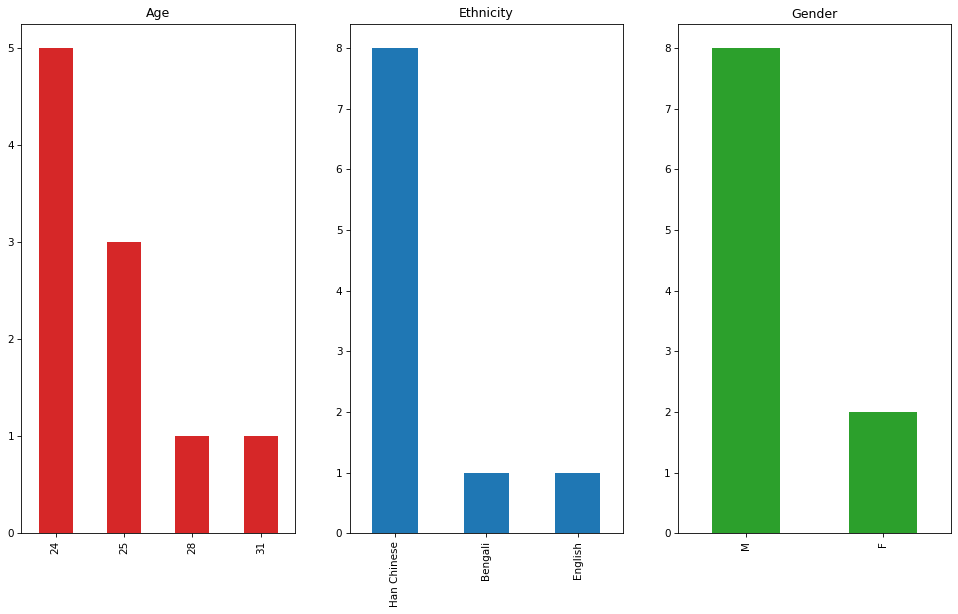

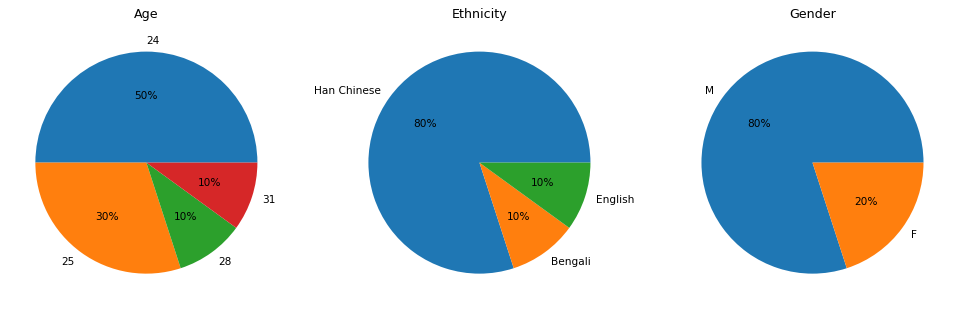



Continuous Features 



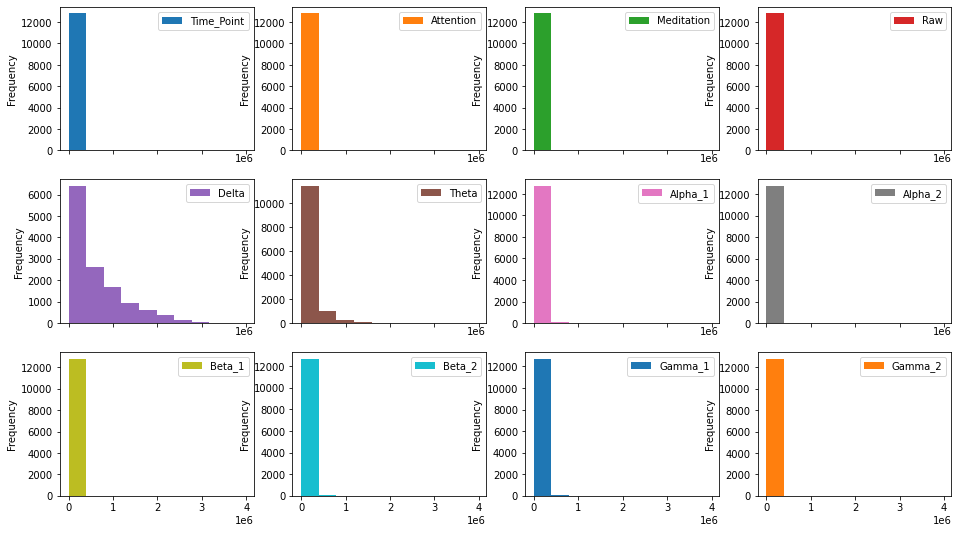

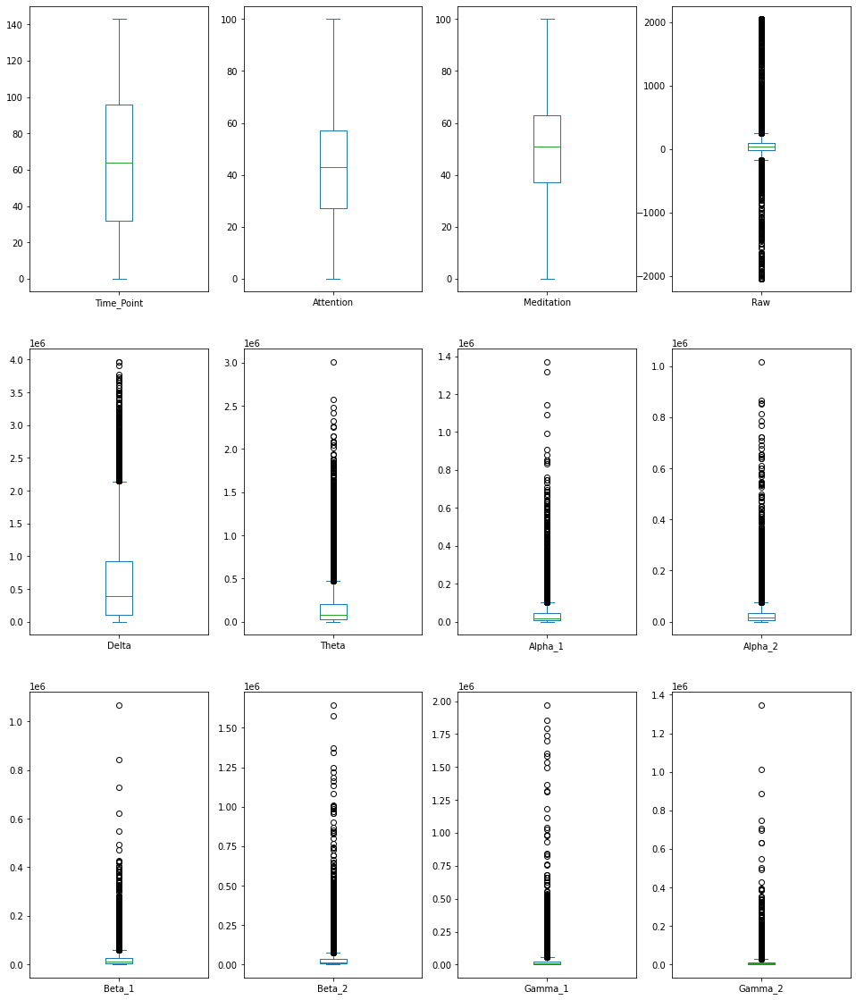

In [7]:
print('Categorial Features', '\n')

# Bar charts
fig, axes = plt.subplots(nrows=1, ncols=3, dpi=75, figsize=(16, 9))
df_demo.Age.sort_values(      ).reset_index(drop=True).value_counts().plot(kind='bar', ax=axes[0], color='tab:red',   title='Age')
df_demo.Ethnicity.sort_values().reset_index(drop=True).value_counts().plot(kind='bar', ax=axes[1], color='tab:blue',  title='Ethnicity')
df_demo.Gender.sort_values(   ).reset_index(drop=True).value_counts().plot(kind='bar', ax=axes[2], color='tab:green', title='Gender')
plt.show()

# Pie charts
fig, axes = plt.subplots(nrows=1, ncols=3, dpi=76.1, figsize=(16, 9), facecolor='white')
df_demo.Age.sort_values(      ).reset_index(drop=True).value_counts().plot(kind='pie', ax=axes[0], ylabel='', autopct='%1.0f%%', title='Age')
df_demo.Ethnicity.sort_values().reset_index(drop=True).value_counts().plot(kind='pie', ax=axes[1], ylabel='', autopct='%1.0f%%', title='Ethnicity')
df_demo.Gender.sort_values(   ).reset_index(drop=True).value_counts().plot(kind='pie', ax=axes[2], ylabel='', autopct='%1.0f%%', title='Gender')
plt.show()


print('\n')

print('Continuous Features', '\n')

# Bar charts
continuous_features_df.plot(kind='hist', figsize=(15.98, 9), subplots=True, layout=(3, 4))
plt.show()

# Box plots
continuous_features_df.plot(kind='box', figsize=(16.46, 20), subplots=True, layout=(3, 4))
plt.show()

### Multivariate Correlation Analysis

In the multivariate analysis, we use visualizations to explore the relationships and correlations among the continuous features in the dataset.
By examining these visualizations, we gain valuable insights into the connections and dependencies between the continuous variables.
This analysis helps us uncover potential associations and patterns within the data, allowing us to understand how changes in one variable may impact others.
By studying the multivariate relationships, we can make informed decisions and derive meaningful conclusions from the data.

Pairplot 



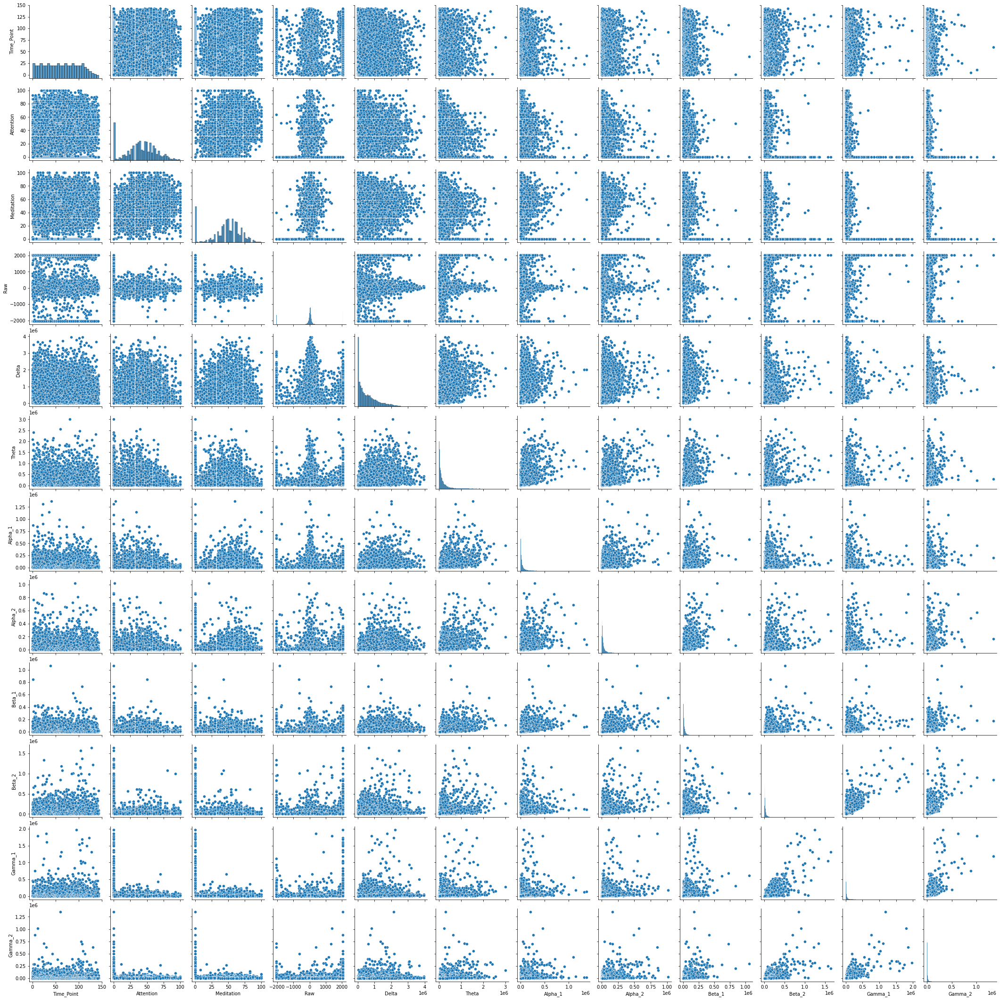



Heatmap 



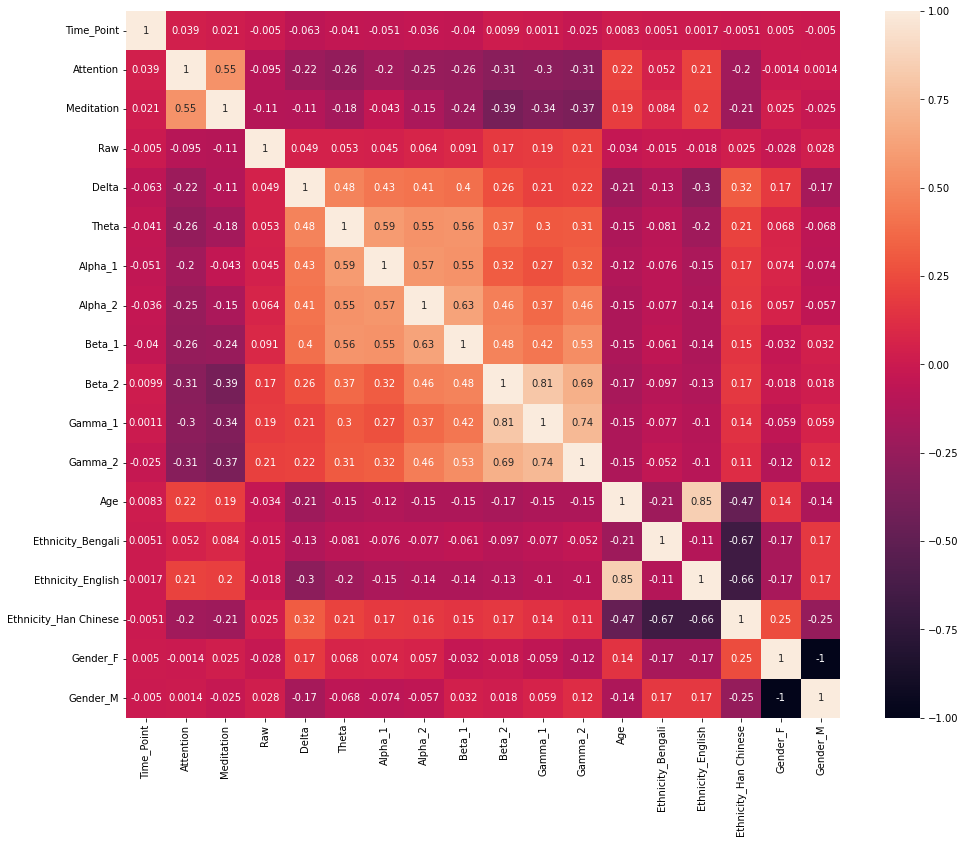

In [8]:
print('Pairplot', '\n')
sns.pairplot(continuous_features_df)
plt.show()

print('\n')

print('Heatmap', '\n')
plt.figure(figsize=(16, 13))
corr_matrix = df.corr()
sns.heatmap(corr_matrix, annot=True)
plt.show()

### Examining Confusion Levels

We aim to compare the EEG data of confused versus not confused subjects.
To achieve this, we categorize the signals into three categories based on the method of labeling: labeled by the author, labeled by the subjects, and labeled the same by both the author and the subjects.
Once the signals are categorized, we compute the average for each time point.

By plotting the signals according to their respective frequency and categorizing their labels using the same-labeled by author and subjects criteria, we can easily distinguish the labels from the `Beta_1`, `Delta`, and `Gamma` plots.


**`Time_Point_Figures`:**<br>
This function plots line plots for each time point feature against the `Time_Point`.
It creates a grid of subplots, with each subplot representing a time point feature.
The data for the confused and understand groups are plotted on the respective subplots.
The function also sets the figure size, adds a legend, and a main title to the figure.

**`Compare_Confused_Understand`:**<br>
This function compares the confused and understand data based on the provided queries (`query_1` and `query_2`).
It extracts the relevant columns for the time point features from the dataset (`df_hold` by default) and calls the `Time_Point_Figures` function to generate the plot comparing the two datasets.

In [9]:
# Time point features
time_point_features = continuous_features[1:] # Exclude 'Time_Point'
time_point_features.remove('Raw')

# Display the layout of features
for i in range(len(time_point_features)//2):
    fi = time_point_features[2*i]
    print(fi, ' '*(10 - len(fi)), time_point_features[2*i + 1])
# Attention   Meditation
# Delta       Theta
# Alpha_1     Alpha_2
# Beta_1      Beta_2
# Gamma_1     Gamma_2


# Plot the time point features against 'Time_Point'
def Time_Point_Figures(df_confused, df_understand, title):
    sns.set(rc={'figure.figsize':(30, 20)})
    fig, axs = plt.subplots(5, 2)
    
    for i, feature in enumerate(time_point_features):
        sns.lineplot(x='Time_Point', y=feature, ax=axs[i//2, i%2], ci=None, data=df_confused) # [0, 0], [0, 1],
        sns.lineplot(x='Time_Point', y=feature, ax=axs[i//2, i%2], ci=None, data=df_understand) # [1, 0], [1, 1], ...
    
    fig.legend(labels=['Confused', 'Not Confused'], loc='lower center', ncol=2)
    fig.suptitle(title)
    plt.show()
    return None


# Compare Confused and Understand data
def Compare_Confused_Understand(query_1, query_2, title, dataframe=df_hold.copy()):
    df_confused   = dataframe.query(query_1)[['Time_Point'] + time_point_features]
    df_understand = dataframe.query(query_2)[['Time_Point'] + time_point_features]
    Time_Point_Figures(df_confused, df_understand, title)
    return None

Attention   Meditation
Delta       Theta
Alpha_1     Alpha_2
Beta_1      Beta_2
Gamma_1     Gamma_2


We are calling the `Compare_Confused_Understand` function with different query conditions and titles to generate visualizations for different label comparisons.
The results will be displayed for "Confused vs. Not Confused" labeled by the author, labeled by subjects, and labeled the same by the author and subjects.

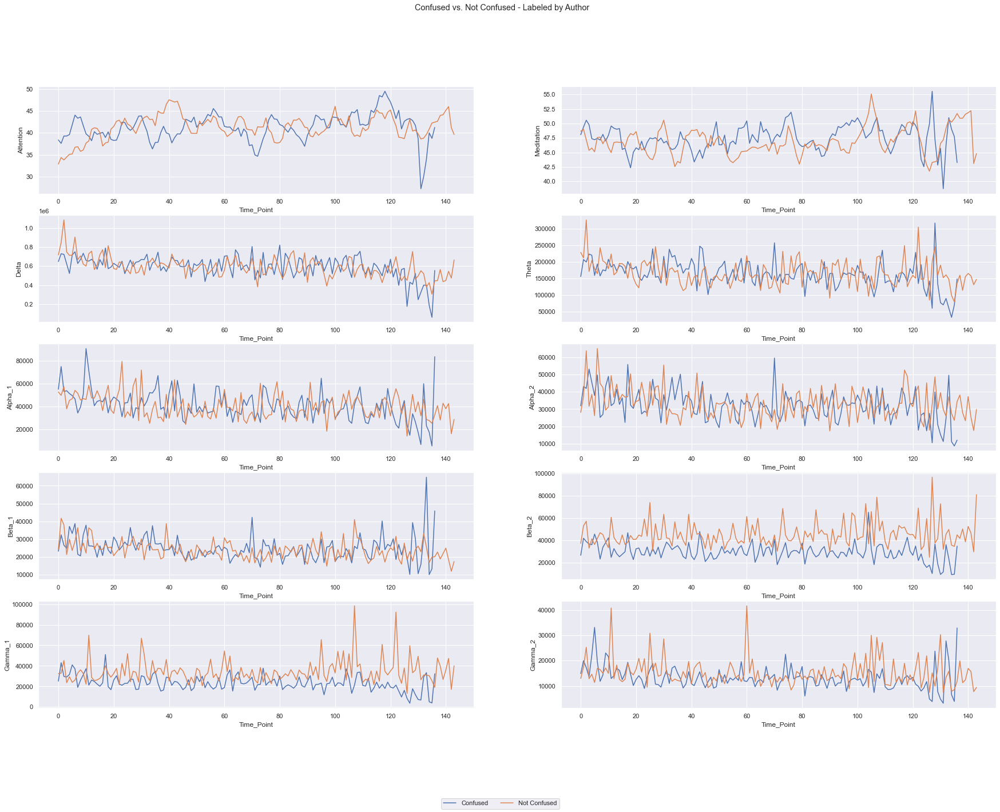

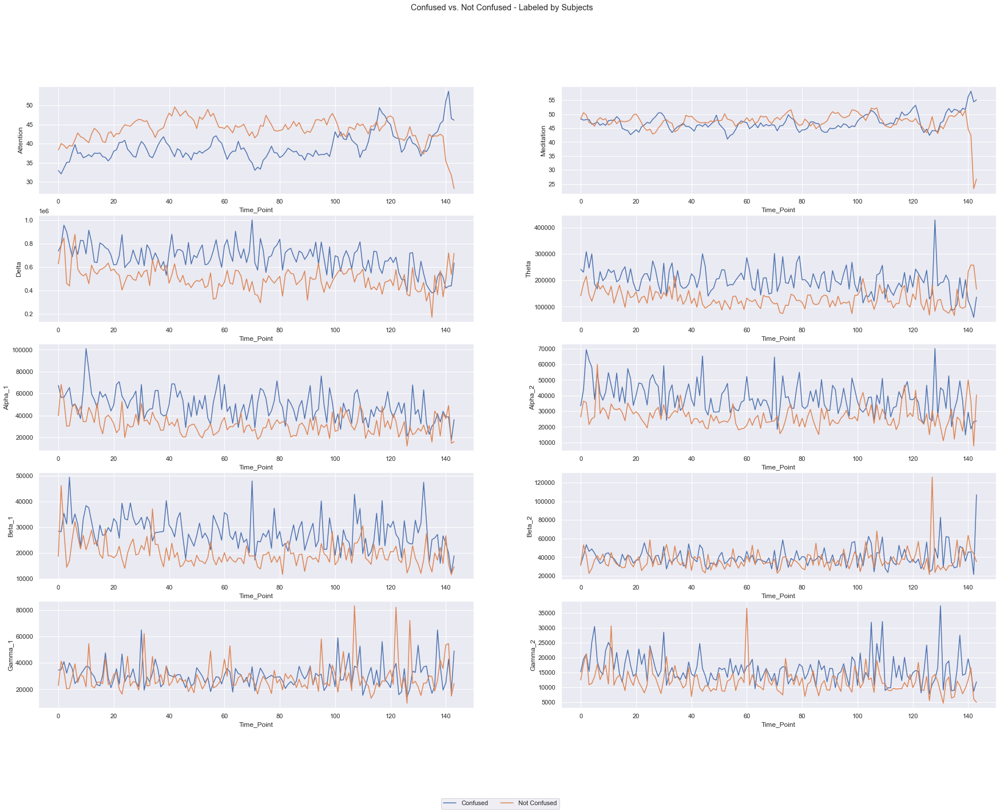

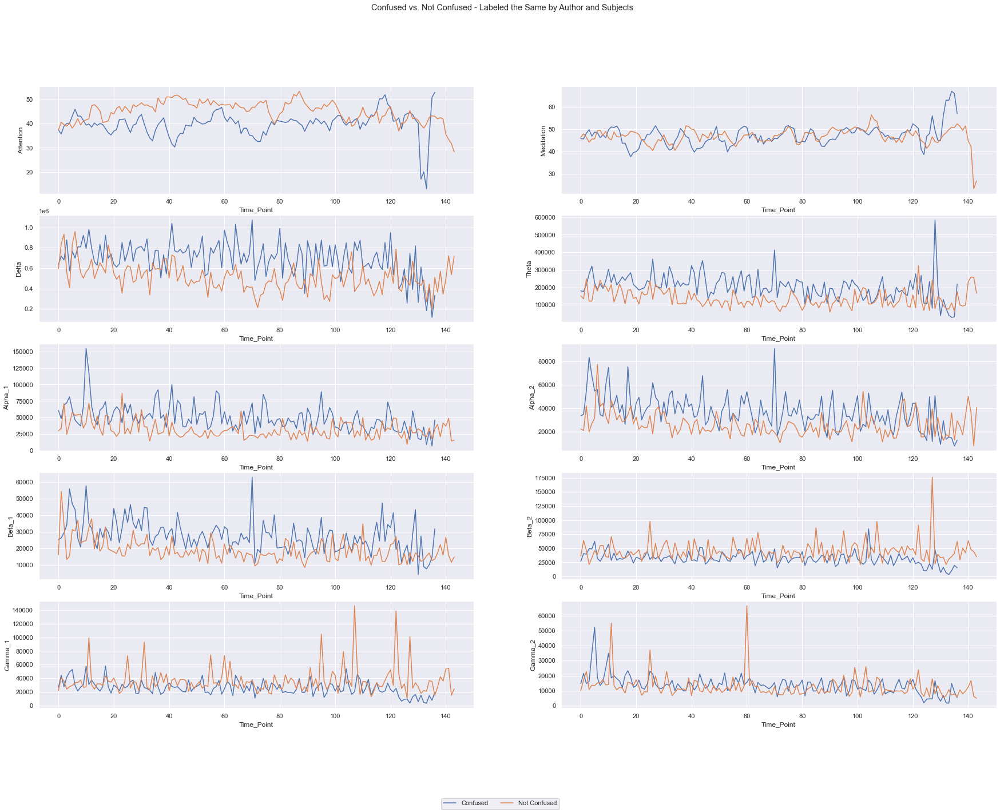

In [10]:
# Plot the time point features against 'Time_Point'

query_1 = 'Predefined_Label == 1'
query_2 = 'Predefined_Label == 0'
title = 'Confused vs. Not Confused - Labeled by Author'
Compare_Confused_Understand(query_1, query_2, title)

print('\n')

query_1 = '`User-defined_Label` == 1' # Using backticks to handle the hyphen in the feature name
query_2 = '`User-defined_Label` == 0'
title = 'Confused vs. Not Confused - Labeled by Subjects'
Compare_Confused_Understand(query_1, query_2, title)

print('\n')

query_1 = 'Predefined_Label == 1 & `User-defined_Label` == 1'
query_2 = 'Predefined_Label == 0 & `User-defined_Label` == 0'
title = 'Confused vs. Not Confused - Labeled the Same by Author and Subjects'
Compare_Confused_Understand(query_1, query_2, title)

### Normalize the Data

We perform Z-score normalization on the selected EEG features.
Z-score normalization is used to standardize the scale of features by transforming them to have zero mean and unit variance.
This normalization technique is applied to address the wide scale of some EEG features, ensuring that all features are on a comparable scale.

In [11]:
df_Std = StandardScaler().fit_transform(df.copy())
df_Std = pd.DataFrame(df_Std, columns=df.columns)
df_Std = pd.concat([df_Std[continuous_features[1:]], df[dummy_features]], axis=1) # Attention, Meditation, Raw, Delta, Theta, Alpha_1, Alpha_2, Beta_1, Beta_2, Gamma_1, Gamma_2

**`Before_After_Figures`:**
This function plots a subset of samples from the continuous features dataframe (`continuous_features_df`) and the normalized dataframe (`df_Std`).
The plots are displayed side by side, with the left plot representing the features before normalization and the right plot representing the features after normalization.
The number of samples to be plotted can be adjusted using the `n_sample` parameter.

The purpose of this visualization is to showcase the impact of the normalization process on the feature values, allowing for a visual assessment of the changes in the distribution and scale of the features after normalization.

In [12]:
# Display the layout of features
print('Before    After')


# Plot the Confused vs. Not Confused data
def Before_After_Figures(n_sample=100):
    fig, axs = plt.subplots(1, 2)
    
    start, end = 1, None
    continuous_features_df.iloc[:n_sample, start:end].plot(figsize=(30, 10), ax=axs[0], title='Before Normalization')
    
    start, end = None, len(continuous_features) - 1
    df_Std.iloc[                :n_sample, start:end].plot(figsize=(30, 10), ax=axs[1], title='After Normalization')

    plt.show()
    return None

Before    After


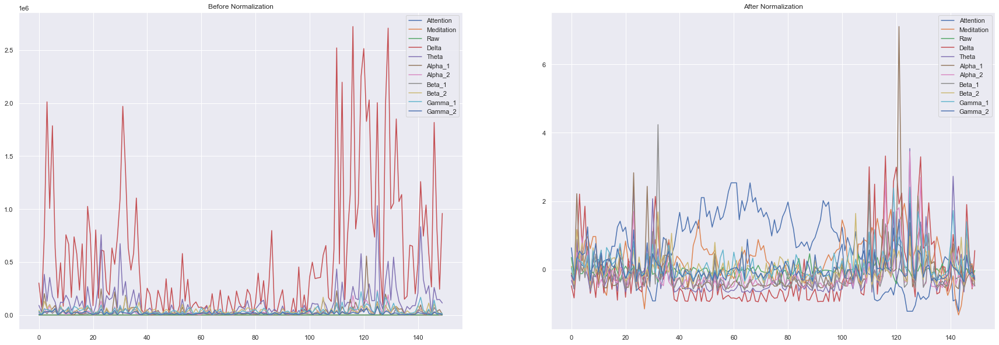

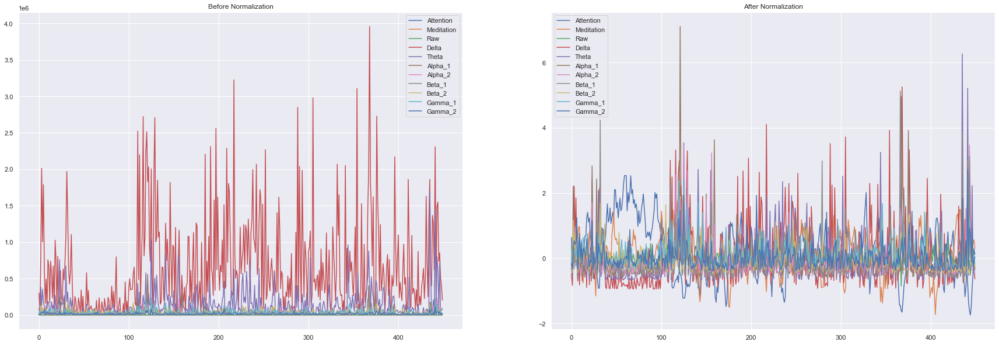

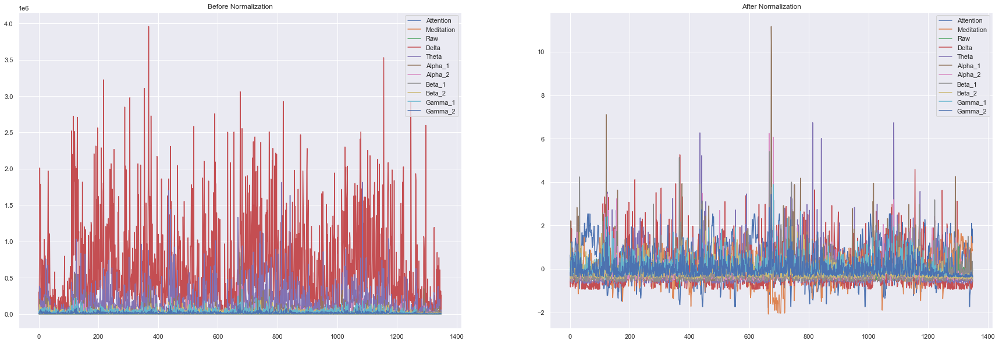

In [13]:
# Plot the Confused vs. Not Confused data
n_sample = 150

for i in range(3):
    if i != 0:
        print('\n')
    else:
        pass
    Before_After_Figures((3**i)*n_sample)

---
<div id='section2' style='text-align: right'>
    <a href='#toc'>Table of Contents</a><br>
    <a href='#section1'>Section 1</a><br>
    <a href='#section2'>Section 2</a><br>
    <a href='#section3'>Section 3</a><br>
    <a href='#license'>License</a>
    </div>

# 2. Model Development

In this section, we focus on developing a predictive model to classify confusion levels based on EEG recordings and demographic factors.
We employ a Bidirectional Long Short-Term Memory (BiLSTM) model, a type of recurrent neural network (RNN), known for its ability to capture temporal dependencies in sequential data.

<div id='section2a' style='text-align: right'>
    <a href='#section2'>Section 2</a><br>
    <a href='#section2a'>Subsection 2.A</a><br>
    <a href='#section2b'>Subsection 2.B</a><br>
    <a href='#section3'>Section 3</a>
    </div>

## 2.A. BiLSTM Model

We describe the architecture and implementation details of the BiLSTM model.
The input data is preprocessed and split into training and testing sets.
We then construct the BiLSTM model using the `TensorFlow` `Keras` library, defining the number of LSTM units, dropout rate, and activation functions.
The model is trained on the training set and evaluated on the testing set.
We report the performance metrics, including `accuracy`, `precision`, `recall`, and `F1-score`, to assess the model's effectiveness in predicting confusion levels.

### Train Test Split

In this code cell, the preprocessed features are assigned to `X` and the target variable is assigned to `y`.
The data is then split into training and test sets using `train_test_split` from scikit-learn.
The shapes of the train and test sets are printed for verification.

Since the BiLSTM model expects input in a specific shape `(batch_size, time_steps, features)`, the training and test data are reshaped accordingly using `np.array().reshape()`.
The reshaped shapes are printed to confirm the new dimensions.

In [14]:
X = df_Std.copy() # Copy the preprocessed features
y = df_hold['User-defined_Label'] # Select the target variable

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=117)
print(f'Shape: {X_train.shape}, {X_test.shape}, {y_train.shape}, {y_test.shape}', '\n')
# (10248, 17), (2563, 17), (10248,), (2563,)


# Reshape the data as required by the model
X_train = np.array(X_train).reshape(-1, n_features, 1) # n_features = 17
X_test  = np.array(X_test ).reshape(-1, n_features, 1)
print(f'Reshaped: {X_train.shape}, {X_test.shape}, {y_train.shape}, {y_test.shape}')
# ((10248, 17, 1), (2563, 17, 1), (10248,), (2563,))

Shape: (10248, 17), (2563, 17), (10248,), (2563,) 

Reshaped: (10248, 17, 1), (2563, 17, 1), (10248,), (2563,)


### Initializing Our BiLSTM Model

We initialize an instance of `BiLSTM_Model`.
This is Bidirectional LSTM (Long Short-Term Memory) model, which is a type of recurrent neural network architecture.

In [15]:
model = BiLSTM_Model()

In [16]:
model.summary()

# Model: "sequential"
# _________________________________________________________________
#  Layer (type)                Output Shape              Param #   
# =================================================================
#  dense (Dense)               (None, 17, 64)            128       
                                                                 
#  bidirectional (Bidirectiona  (None, 17, 512)          657408    
#  l)                                                              
                                                                 
#  dropout (Dropout)           (None, 17, 512)           0         
                                                                 
#  bidirectional_1 (Bidirectio  (None, 17, 512)          1574912   
#  nal)                                                            
                                                                 
#  dropout_1 (Dropout)         (None, 17, 512)           0         
                                                                 
#  flatten (Flatten)           (None, 8704)              0         
                                                                 
#  dense_1 (Dense)             (None, 128)               1114240   
                                                                 
#  dense_2 (Dense)             (None, 1)                 129       
                                                                 
# =================================================================
# Total params: 3,346,817
# Trainable params: 3,346,817
# Non-trainable params: 0
# _________________________________________________________________

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 17, 64)            128       
                                                                 
 bidirectional (Bidirectiona  (None, 17, 512)          657408    
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 17, 512)           0         
                                                                 
 bidirectional_1 (Bidirectio  (None, 17, 512)          1574912   
 nal)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 17, 512)           0         
                                                                 
 flatten (Flatten)           (None, 8704)              0

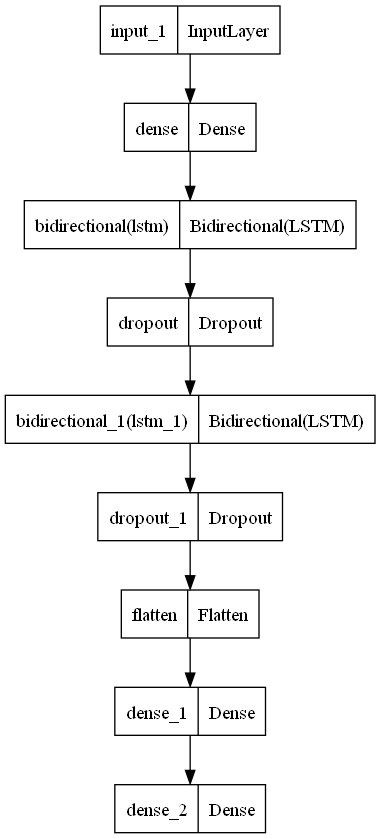

In [17]:
plot_model(model)

### Training Our Model

In this step, we will train our model using a training dataset.
The training process will consist of multiple epochs, where each epoch represents a complete pass through the training data.
We will train the model for `100` `epochs`, allowing it to learn and adjust its parameters over time.

During the training process, we will use a `learning rate` of `0.001`.
The learning rate determines the step size at each iteration, controlling how much the model's parameters are updated based on the calculated gradients.
A smaller learning rate can result in slower convergence but more precise updates, while a larger learning rate can lead to faster convergence but risk overshooting the optimal solution.

Additionally, we will set the `batch size` to `20`.
The batch size refers to the number of samples processed before the model's parameters are updated.
Using batches allows for more efficient computation by performing updates in smaller chunks rather than processing the entire training dataset at once.

By training our model over multiple epochs with an appropriate learning rate and batch size, we aim to optimize its performance and improve its ability to generalize and make accurate predictions.


Epoch 1: val_accuracy improved from -inf to 0.58720, saving model to .\_best_model_singleTrial.h5

Epoch 2: val_accuracy improved from 0.58720 to 0.59852, saving model to .\_best_model_singleTrial.h5

Epoch 3: val_accuracy improved from 0.59852 to 0.61529, saving model to .\_best_model_singleTrial.h5

Epoch 4: val_accuracy improved from 0.61529 to 0.64378, saving model to .\_best_model_singleTrial.h5

Epoch 5: val_accuracy did not improve from 0.64378

Epoch 6: val_accuracy improved from 0.64378 to 0.64651, saving model to .\_best_model_singleTrial.h5

Epoch 7: val_accuracy did not improve from 0.64651

Epoch 8: val_accuracy improved from 0.64651 to 0.64924, saving model to .\_best_model_singleTrial.h5

Epoch 9: val_accuracy improved from 0.64924 to 0.66250, saving model to .\_best_model_singleTrial.h5

Epoch 10: val_accuracy improved from 0.66250 to 0.67499, saving model to .\_best_model_singleTrial.h5

Epoch 11: val_accuracy improved from 0.67499 to 0.67811, saving model to .\_best_

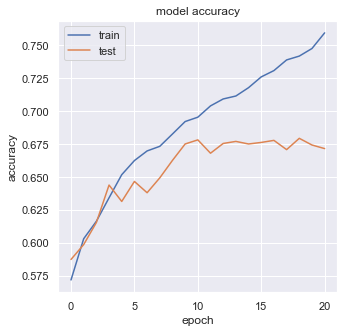

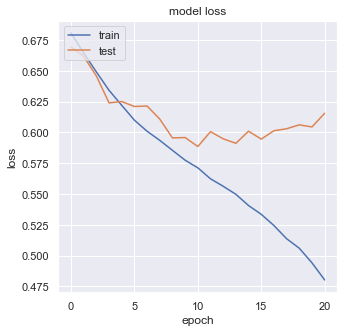

In [18]:
# LONG RUN TIME

n_epochs = 50 # 50 is recommended

# Train the model and save the training history
model, history = Train_Model(model, X_train, y_train, X_test, y_test, save_to='./', epoch=n_epochs)


# Epoch 1: val_accuracy improved from -inf to 0.59384, saving model to .\_best_model_singleTrial.h5

# Epoch 2: val_accuracy improved from 0.59384 to 0.62349, saving model to .\_best_model_singleTrial.h5

# ...

# Epoch 22: val_accuracy did not improve from 0.69294

# Epoch 23: val_accuracy did not improve from 0.69294
# Epoch 23: early stopping

### Confusion Matrix

The code calculates the confusion matrix (`cm`) using the `confusion_matrix` function.
The confusion matrix provides an overview of the model's performance by showing the counts of true positives, true negatives, false positives, and false negatives.
Then, we visualize the confusion matrix using a `heatmap`, with annotations showing the counts.
The x-axis represents the predicted values, and the y-axis represents the actual values.

81/81 [==============================] - 7s 62ms/step

Predicted: 1    Actual: 0    Match: False
Predicted: 0    Actual: 0    Match: True
Predicted: 0    Actual: 0    Match: True
Predicted: 1    Actual: 0    Match: False
Predicted: 1    Actual: 0    Match: False
Predicted: 1    Actual: 1    Match: True
Predicted: 1    Actual: 0    Match: False
Predicted: 0    Actual: 1    Match: False
Predicted: 0    Actual: 0    Match: True
Predicted: 0    Actual: 1    Match: False
... 

Matches:    1721 (67.15%)
Mismatches:  842 (32.85%) 



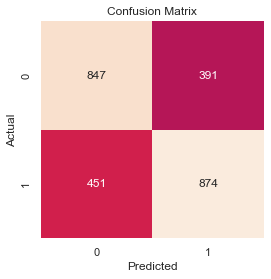

In [19]:
# Predicting and converting probabilities to binary predictions
y_pred = model.predict(X_test)
y_pred = np.array(y_pred>=0.5, dtype=int)

# Converting predictions and actual values to lists of integers
y_pred_list = [a[0] for a in y_pred]
y_test_list = list(y_test.astype(int))


print()

# Printing the first 10 predictions and their corresponding actual values
for i in range(10):
    y_p = y_pred_list[i]
    y_t = y_test_list[i]
    print(f'Predicted: {y_p}    Actual: {y_t}    Match: {y_p == y_t}')
print('...', '\n')
# Predicted: 1    Actual: 0    Match: False
# Predicted: 1    Actual: 0    Match: False
# Predicted: 0    Actual: 0    Match: True
# Predicted: 1    Actual: 0    Match: False
# Predicted: 1    Actual: 0    Match: False
# Predicted: 1    Actual: 1    Match: True
# Predicted: 0    Actual: 0    Match: True
# Predicted: 0    Actual: 1    Match: False
# Predicted: 0    Actual: 0    Match: True
# Predicted: 0    Actual: 1    Match: False

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
# [[889, 349],
#  [491, 834]]

matches    = cm[0][0] + cm[1][1]
mismatches = cm[0][1] + cm[1][0]
total = matches + mismatches

percent_matches    = round(100*   matches/total, 2)
percent_mismatches = round(100*mismatches/total, 2)


print(f'Matches:    {matches} ({percent_matches}%)')
print(f'Mismatches:  {mismatches} ({percent_mismatches}%)', '\n')

plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### Classification Report

The `classification_report` provides a comprehensive overview of the model's performance for each class and overall.
It is a useful tool for evaluating the performance of a classification model.

- **`precision`:**
Precision is the ratio of true positives to the sum of true positives and false positives.
It measures the accuracy of the positive predictions.
In this case, precision for class 0 (not confused) is `0.64`, indicating that 64% of the samples predicted as class 0 were actually class 0.
Precision for class 1 (confused) is `0.70`, indicating that 70% of the samples predicted as class 1 were actually class 1.
- **`recall`:**
Recall is the ratio of true positives to the sum of true positives and false negatives.
It measures the ability of the model to identify positive samples.
In this case, recall for class 0 (not confused) is `0.72`.
Recall for class 1 (confused) is `0.63`.
- **`f1-score`:**
The F1 score is the harmonic mean of precision and recall.
It provides a balanced measure of model performance that considers both precision and recall.
In this case, the F1 scores for both class 0 (not confused) and (confused) are approximately `0.67`.
- **`support`:**
Support refers to the number of samples in each class.
- **`accuracy`:**
Accuracy is the ratio of the correctly predicted samples to the total number of samples.
In this case, the overall accuracy is `0.67`, indicating that the model correctly predicted 67% of the samples.
- **`macro avg`:**
The macro average calculates the metrics independently for each class and then takes the average.
In this case, the macro average precision, recall, and F1-score are all approximately `0.67`.
- **`weighted avg`:**
The weighted average calculates the metrics weighted by the support of each class.
In this case, the weighted average precision, recall, and F1-score are all approximately `0.67`.

In [20]:
print(classification_report(y_test, y_pred))

#               precision    recall  f1-score   support

#          0.0       0.64      0.72      0.68      1238
#          1.0       0.70      0.63      0.67      1325

#     accuracy                           0.67      2563
#    macro avg       0.67      0.67      0.67      2563
# weighted avg       0.68      0.67      0.67      2563

              precision    recall  f1-score   support

         0.0       0.65      0.68      0.67      1238
         1.0       0.69      0.66      0.67      1325

    accuracy                           0.67      2563
   macro avg       0.67      0.67      0.67      2563
weighted avg       0.67      0.67      0.67      2563



<div id='section2b' style='text-align: right'>
    <a href='#section2'>Section 2</a><br>
    <a href='#section2a'>Subsection 2.A</a><br>
    <a href='#section2b'>Subsection 2.B</a><br>
    <a href='#section3'>Section 3</a>
    </div>

## 2.B. SHAP Analysis

To gain insights into the model's decision-making process, we employ SHAP (Shapley Additive Explanations) analysis.
SHAP values provide a measure of feature importance and help us understand the contribution of each feature to the model's predictions.
By visualizing the SHAP values through summary plots, we can interpret the model's behavior and extract valuable insights.
This analysis enhances the transparency and interpretability of our predictive model.

We delve into the interpretability of the trained model using SHAP (SHapley Additive exPlanations) analysis.
SHAP values are computed to measure the contribution of each feature in the model's predictions.
The SHAP KernelExplainer is utilized to explain the model's behavior, and force plots are generated to visualize the impact of different features on the model's output.
The code also demonstrates how to display the force plot in an HTML format.

We generate a SHAP force plot that provides interpretability and insights into how different features contribute to the model's predictions. The force plot visualizes the SHAP values, which represent the importance and direction of each feature's influence on the predictions.

(SHapley Additive exPlanations) to interpret the predictions of the model. Here's a breakdown of the code cell:

- **`shap.initjs()`:**
This function initializes the JavaScript visualization for SHAP plots.

- **`f(X_0)`:**
This function is defined to compute the model's output for a given input `X_0`.
It reshapes the input data and uses the trained model (`model`) to predict the output.
This function is required by the `shap.KernelExplainer` to explain the model's predictions.

- **`shap_data`:**
This is created by selecting a subset of the test data (`X_test`) to be used for generating SHAP values.
It is reshaped appropriately for input to the SHAP explainer.

- **`explainer`:**
This is created using the `shap.KernelExplainer` class.
It takes the callable function `f` and the `shap_data` as inputs.
The explainer computes the SHAP values for the provided data points.

- **`shap_values`:**
These are calculated using the `shap_values` method of the explainer.
The `nsamples` parameter specifies the number of samples to be used in the estimation of the SHAP values.

- **`shap.force_plot`:**
This is generated using the shap.force_plot function.
It takes the expected value of the model's output (`explainer.expected_value`), the SHAP values (`shap_values`), and the original data points (`shap_data`) as inputs.
This plot helps visualize the impact of each feature on the model's predictions.

The resulting `force_plot` is then displayed using the `HTML` function, which generates an HTML div element with a lavender background color.
The SHAP `JavaScript` visualization is embedded within this div, along with the force plot.

In [21]:
# LONG RUN TIME

shap.initjs()

# This function is needed to create shap.force_plot
# The shap.KernelExplainer requires a callable function to compute the model's output for a given input
def f(X_0):
    X_1 = np.array(X_0.copy()).reshape(-1, n_features, 1)
    return model.predict(X_1).flatten()

shap_data = train_test_split(X, y, test_size=0.20, random_state=117)[1].sample(30, random_state=117) # 30 rows fram X_test
explainer = shap.KernelExplainer(f, shap_data)
shap_values = explainer.shap_values(shap_data, nsamples=500)


print('\n')

print('Comprehensive SHAP Force Plot', '\n')
force_plot = shap.force_plot(explainer.expected_value, shap_values, shap_data)

# Displays shap.force_plot on white background
display(HTML(f'<div style="background-color:White;">{shap.getjs() + force_plot.html()}</div>'))

1/1 [==============================] - 0s 70ms/step


  0%|          | 0/30 [00:00<?, ?it/s]

469/469 [==============================] - 30s 64ms/step


Comprehensive SHAP Force Plot 



### Feature Importance Analysis

To understand the importance of each feature and its effect on our model, we utilize the `shap.summary_plot` function.
In particular, we use the following type of plot:

**Average Impact on Model Output (`plot_type='bar'`):**
This plot provides an overview of the average impact of each feature on the model's output.
The higher the value on the y-axis, the more influential the feature is in determining the model's predictions.
The bars represent the magnitude of the feature's impact, with positive values indicating a positive influence and negative values indicating a negative influence.

Our analysis, using SHAP (SHapley Additive exPlanations), provided valuable insights into the important features influencing our model's predictions. The following features emerged as the most influential:

- **`Attention`:** This feature had the highest impact on the model's predictions, indicating that the level of attention exhibited by the subjects during the EEG recording played a crucial role in determining the outcomes.

- **`Gamma_2`:** The Gamma_2 feature showed significant importance, suggesting that the specific gamma band activity captured by the EEG biosensor was closely related to the model's predictions.

Additionally, the following features were also found to be influential:

- **`Delta`:** The Delta feature demonstrated a notable impact on the model's predictions. Delta brain waves, associated with deep sleep and relaxation, seemed to have a meaningful association with the outcomes.

- **`Gamma_1`:** The Gamma_1 feature exhibited a considerable influence on the model, highlighting the relevance of gamma band activity in the EEG signals for predicting the target variable.

- **`Beta_2`:** The Beta_2 feature was among the important factors influencing the model's predictions. Beta brain waves, associated with active thinking and concentration, played a role in determining the outcomes.

Surprisingly, our analysis indicated that Age, despite the limited range in our dataset, was one of the least important features for the model's predictions. This suggests that when utilizing an EEG biosensor in an educational setting, it may be applicable to students within the age range of 20-30 and potentially even extend its usability to a wider age range.

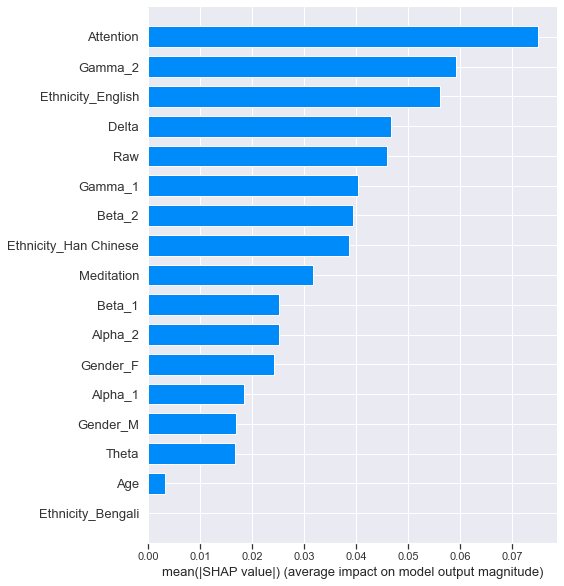

In [22]:
shap.summary_plot(shap_values, shap_data, plot_type='bar')

### Feature Impact Analysis

To understand the effect on our model, we utilize the `shap.summary_plot` function.

**Impact on Model Output:**
This plot visualizes the individual impact of each feature on the model's output.
The x-axis represents the feature's value, while the y-axis represents the corresponding impact on the model's output.
The color of each data point indicates the feature's value, with warmer colors indicating higher feature values and cooler colors indicating lower feature values.

We can conclude the following insights:

- Higher values of `Attention` are associated with a greater likelihood of understanding, as they have a positive impact on the model's output.
- Higher values of `Gamma_2` and `Delta` also contribute positively to the model's predictions, indicating a higher chance of understanding.
- Features like `Age` and `Gender` have minimal correlation with the model's output, suggesting that they have limited influence on predicting understanding.

It is interesting to note that the low variance in `Ethnicity` has significant impacts on the model's predictions.
This observation raises the question of how much ethnicity actually plays a role in determining the understanding or confusion levels.
To further investigate the influence of Ethnicity on the model's output, it would be beneficial to collect more data.

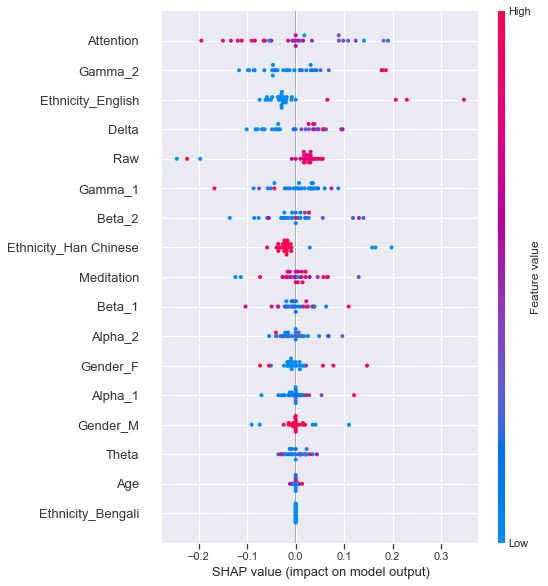

In [24]:
shap.summary_plot(shap_values, shap_data)

### Visualizing Individual Feature Contributions with Force Plots

We generate five single-row force plots using the `SHAP` library.
Each force plot visualizes the individual feature contributions to the model's output for a specific data instance.
By iterating over a range of five data instances, we can examine the feature contributions and understand how each feature impacts the model's output for these specific instances.

In [25]:
# Displays five single-row force plots
for i in range(5):
    single_force_plot = shap.force_plot(explainer.expected_value, shap_values[i, :], shap_data.iloc[i, :])
    
    # Displays shap.force_plot on white background
    display(HTML(f'<div style="background-color:White;">{shap.getjs() + single_force_plot.html()}</div>'))

---
<div id='section3' style='text-align: right'>
    <a href='#toc'>Table of Contents</a><br>
    <a href='#section1'>Section 1</a><br>
    <a href='#section2'>Section 2</a><br>
    <a href='#section3'>Section 3</a><br>
    <a href='#license'>License</a>
    </div>

# 3. Conclusion

In this final section, we summarize the key findings and outcomes of our project.

<div id='section3a' style='text-align: right'>
    <a href='#section3'>Section 3</a><br>
    <a href='#section3a'>Subsection 3.A</a><br>
    <a href='#section3b'>Subsection 3.B</a><br>
    <a href='#license'>License</a>
    </div>

## 3.A. Results

We provide a concise summary of the results obtained from the data analysis and model development.
This includes an overview of the preprocessing steps, feature selection, EDA findings, model architecture, and performance metrics.
We highlight the key insights and contributions of our work.

### Model Performance

Our model, the Bidirectional Long Short-Term Memory (BiLSTM), utilizes a variety of features to predict whether a subject is confused or not.
These features include `Attention`, `Meditation`, `Raw`, `Delta`, `Theta`, `Alpha_1`, `Alpha_2`, `Beta_1`, `Beta_2`, `Gamma_1`, `Gamma_2`, `Age`, `Ethnicity_Bengali`, `Ethnicity_English`, `Ethnicity_Han Chinese`, `Gender_F`, and `Gender_M`.
By leveraging these features, our model aims to accurately classify subjects based on their confusion levels.

Based on the evaluation metrics, our model demonstrates a moderate performance in predicting the confusion levels of subjects.
The `precision` values for class 0 (not confused) and class 1 (confused) are `0.64` and `0.70`, respectively.
This indicates that 64% of the samples predicted as not confused were indeed not confused, while 70% of the samples predicted as confused were actually confused.

When considering `recall`, which measures the model's ability to correctly identify positive samples, we observe a recall of `0.72` for class 0 (not confused) and `0.63` for class 1 (confused).
These values suggest that our model is better at identifying samples that are not confused compared to identifying samples that are confused.
print(classification_report(y_test, y_pred))
The F1 score (`f1-score`), which provides a balanced measure by considering both precision and recall, yields approximately `0.67` for both class 0 (not confused) and class 1 (confused).
This score indicates a reasonable trade-off between precision and recall, reflecting the model's overall performance in predicting both classes.

Overall, while our model demonstrates moderate predictive capabilities, there is still room for improvement to achieve higher precision and recall values, particularly for identifying subjects who are confused.

Matches:    1721 (67.15%)
Mismatches:  842 (32.85%) 



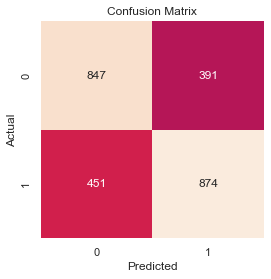


              precision    recall  f1-score   support

         0.0       0.65      0.68      0.67      1238
         1.0       0.69      0.66      0.67      1325

    accuracy                           0.67      2563
   macro avg       0.67      0.67      0.67      2563
weighted avg       0.67      0.67      0.67      2563



In [26]:
print(f'Matches:    {matches} ({percent_matches}%)')
print(f'Mismatches:  {mismatches} ({percent_mismatches}%)', '\n')

plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


print()

print(classification_report(y_test, y_pred))

### Feature Importance

Our analysis using SHAP revealed that the most important features for our model were `Attention` and `Gamma_2` (magnitude greater than `0.06`), followed closely by `Delta`, `Gamma_1`, and `Beta_2` (magnitude greater than `0.04`).
Surprisingly, despite having a limited range of ages in the dataset, our analysis indicated that `Age` was one of the least important features.
This suggests that when utilizing an EEG biosensor, we might be able to apply it to students within the age range of 20-30 and potentially even extend its applicability to a wider age range.
These findings provide vafeature_importance_plotluable insights into the significant features influencing the model's predictions and the potential implications for using EEG biosensors in educational settings.

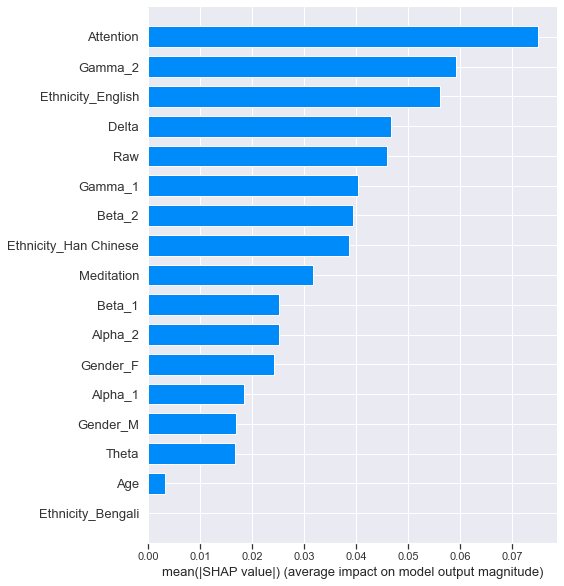

In [27]:
shap.summary_plot(shap_values, shap_data, plot_type='bar')

### Feature Impact


We also found that higher values of the `Attention` feature are associated with a greater likelihood of understanding, as they exert a positive impact on the model's output.
Features such as `Gamma_2` and `Delta` also contribute positively to the model's predictions, indicating a higher chance of understanding when these features have higher values.
Conversely, features like `Age` and `Gender` show minimal correlation with the model's output, suggesting that they have limited influence on predicting understanding.
An interesting observation is the significant impact of the low variance in the `Ethnicity` feature on the model's predictions.
This raises the question of how much ethnicity actually plays a role in determining the levels of understanding or confusion.

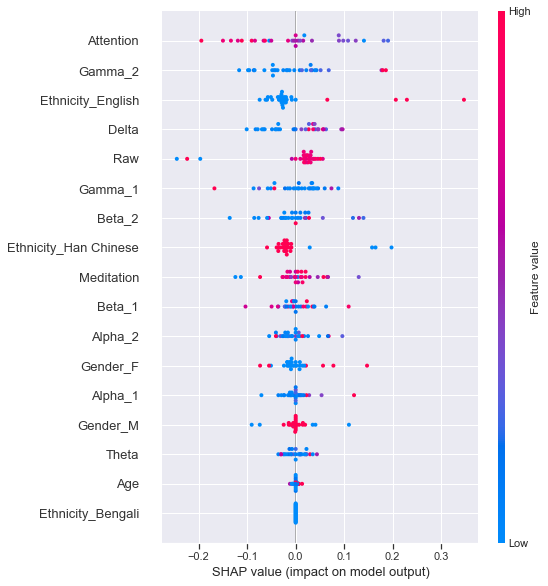

In [28]:
shap.summary_plot(shap_values, shap_data)

<div id='section3b' style='text-align: right'>
    <a href='#section3'>Section 3</a><br>
    <a href='#section3a'>Subsection 3.A</a><br>
    <a href='#section3b'>Subsection 3.B</a><br>
    <a href='#license'>License</a>
    </div>

## 3.B. Next Steps

To further enhance the performance and reliability of our model, several important steps can be taken:

**Collect More Data:**<br>
Expanding our dataset by including more than ten students and more than ten videos would provide a larger and more diverse sample. This increased data volume could help improve the model's ability to generalize and make more accurate predictions.

**Invest in Updated Equipment:**<br>
Upgrading our equipment, such as EEG biosensors or video recording devices, to the latest technology can enhance the quality and precision of the data collected. Improved equipment can provide more accurate and reliable measurements, leading to more robust model training and evaluation.

**Diversify Participant Pool:**<br>
To ensure the model's applicability across various demographics, it is important to diversify our participant pool. Including participants from different age groups, ethnic backgrounds, genders, and educational backgrounds can help capture a more representative sample, reducing biases and improving the model's generalization capabilities.

**Explore Different Algorithms:**<br>
Besides the Bidirectional Long Short-Term Memory (BiLSTM) model used in our current approach, we can explore other algorithms that may offer better performance. One such algorithm is XGBoost, a popular gradient boosting framework known for its high predictive power and efficiency.

**Hyperparameter Tuning:**<br>
Utilizing techniques like GridSearch can help optimize the hyperparameters of our model. By systematically searching through various combinations of hyperparameter values, we can identify the optimal configuration that maximizes the model's performance.

**Moving Average or Temporal Analysis:**<br>
Considering the sequential nature of the data, applying techniques such as moving averages or temporal analysis can capture temporal dependencies and patterns within the EEG signals. These methods can enhance the model's ability to understand the dynamics of confusion levels over time.

By implementing these next steps, we can enhance our model's performance, ensure its robustness across diverse scenarios, and contribute to a more accurate understanding of confusion levels in educational settings.

---
<div id='license' style='text-align: right'>
    <a href='#toc'>Table of Contents</a><br>
    <a href='#section1'>Section 1</a><br>
    <a href='#section2'>Section 2</a><br>
    <a href='#section3'>Section 3</a><br>
    <a href='#license'>License</a>
    </div>

# License

This Notebook has been released under the GNU General Public License v3.0.